In [27]:
import numpy as np 
import matplotlib.pyplot as plt 
from tqdm import tqdm
import cv2
import os
import seaborn as sns
import tensorflow as tf
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

from keras.models import Sequential, Model
from keras.layers import Dense, Flatten, Conv2D, Reshape, Input, Conv2DTranspose
from keras.layers import Activation, LeakyReLU, BatchNormalization, Dropout, Resizing
from keras.losses import BinaryCrossentropy
from tensorflow.keras.applications import VGG16

import warnings
warnings.filterwarnings('ignore')

try:
    from tensorflow.keras.optimizers import Adam, Adamax
except:
    from keras.optimizers import Adam, Adamax

In [28]:
NOISE_DIM = 100  
BATCH_SIZE = 8 
STEPS_PER_EPOCH = 3750
EPOCHS = 10
SEED = 40
WIDTH, HEIGHT, CHANNELS = 128, 128, 1

OPTIMIZER = Adamax(0.0002, 0.5)

In [29]:
MAIN_DIR = "../input/brain-mri-images-for-brain-tumor-detection/yes"

# Loading and Preprocessing the Images

In [30]:
def load_images(folder):
    
    imgs = []
    target = 1
    labels = []
    for i in os.listdir(folder):
        img_dir = os.path.join(folder,i)
        try:
            img = cv2.imread(img_dir)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            img = cv2.resize(img, (128,128))
            imgs.append(img)
            labels.append(target)
        except:
            continue
        
    imgs = np.array(imgs)
    labels = np.array(labels)
    
    return imgs, labels

In [31]:
data, labels = load_images(MAIN_DIR)
data.shape, labels.shape

((155, 128, 128), (155,))

## Generate 20 random numbers to index images from data

In [32]:
np.random.seed(SEED)
idxs = np.random.randint(0, 155, 20)

In [33]:
X_train = data[idxs]
X_train.shape

(20, 128, 128)

## Normalize and Reshape the Data

In [34]:
# Normalize the Images
X_train = (X_train.astype(np.float32) - 127.5) / 127.5

# Reshape images 
X_train = X_train.reshape(-1, WIDTH,HEIGHT,CHANNELS)

# Check shape
X_train.shape

(20, 128, 128, 1)

## Plotting The Real Images

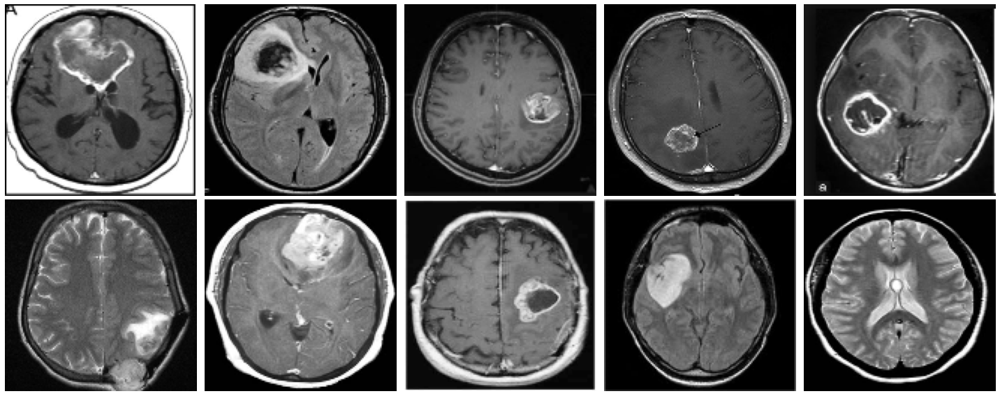

In [35]:
plt.figure(figsize=(20,8))
for i in range(10):
    axs = plt.subplot(2,5,i+1)
    plt.imshow(X_train[i], cmap="gray")
    plt.axis('off')
    axs.set_xticklabels([])
    axs.set_yticklabels([])
    plt.subplots_adjust(wspace=None, hspace=None)
plt.tight_layout()

# The Architecture

In [36]:
def build_generator():

    """
        Generator model "generates" images using random noise. The random noise AKA Latent Vector
        is sampled from a Normal Distribution which is given as the input to the Generator. Using
        Transposed Convolution, the latent vector is transformed to produce an image
        We use 3 Conv2DTranspose layers (which help in producing an image using features; opposite
        of Convolutional Learning)

        Input: Random Noise / Latent Vector
        Output: Image
    """

    model = Sequential([

        Dense(16*16*256, input_dim=NOISE_DIM),
        LeakyReLU(alpha=0.2),
        Reshape((16,16,256)),
        
        Conv2DTranspose(128, (4, 4), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),
        
        Conv2DTranspose(128, (4, 4), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2DTranspose(128, (4, 4), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2D(CHANNELS, (4, 4), padding='same', activation='tanh')
    ], 
    name="generator")
    model.summary()
    model.compile(loss="binary_crossentropy", optimizer=OPTIMIZER)

    return model

In [37]:
def build_discriminator():
    
    """
        Discriminator is the model which is responsible for classifying the generated images
        as fake or real. Our end goal is to create a Generator so powerful that the Discriminator
        is unable to classify real and fake images
        A simple Convolutional Neural Network with 2 Conv2D layers connected to a Dense output layer
        Output layer activation is Sigmoid since this is a Binary Classifier

        Input: Generated / Real Image
        Output: Validity of Image (Fake or Real)

    """

    model = Sequential([

        Conv2D(64, (3, 3), padding='same', input_shape=(WIDTH, HEIGHT, CHANNELS)),
        LeakyReLU(alpha=0.2),

        Conv2D(128, (3, 3), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2D(128, (3, 3), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),
        
        Conv2D(256, (3, 3), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),
        
        Flatten(),
        Dropout(0.4),
        Dense(1, activation="sigmoid", input_shape=(WIDTH, HEIGHT, CHANNELS))
    ], name="discriminator")
    model.summary()
    model.compile(loss="binary_crossentropy",
                        optimizer=OPTIMIZER)

    return model

# Putting it together

In [38]:
print('\n')
discriminator = build_discriminator()
print('\n')
generator = build_generator()

discriminator.trainable = False 

gan_input = Input(shape=(NOISE_DIM,))
fake_image = generator(gan_input)

gan_output = discriminator(fake_image)

gan = Model(gan_input, gan_output, name="gan_model")
gan.compile(loss="binary_crossentropy", optimizer=OPTIMIZER)

print("The Combined Network:\n")
gan.summary()



Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 128, 128, 64)      640       
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (None, 128, 128, 64)      0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 64, 64, 128)       73856     
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (None, 64, 64, 128)       0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 32, 32, 128)       147584    
_________________________________________________________________
leaky_re_lu_10 (LeakyReLU)   (None, 32, 32, 128)       0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 16, 16, 256)   

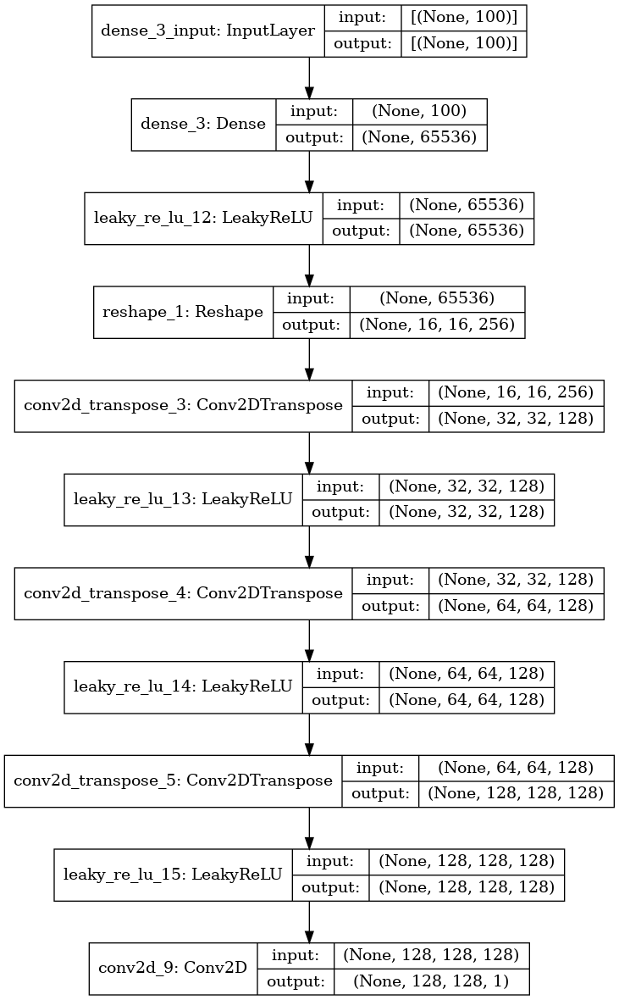

In [39]:
tf.keras.utils.plot_model(generator, to_file='gen.png', show_shapes=True, show_layer_names=True)

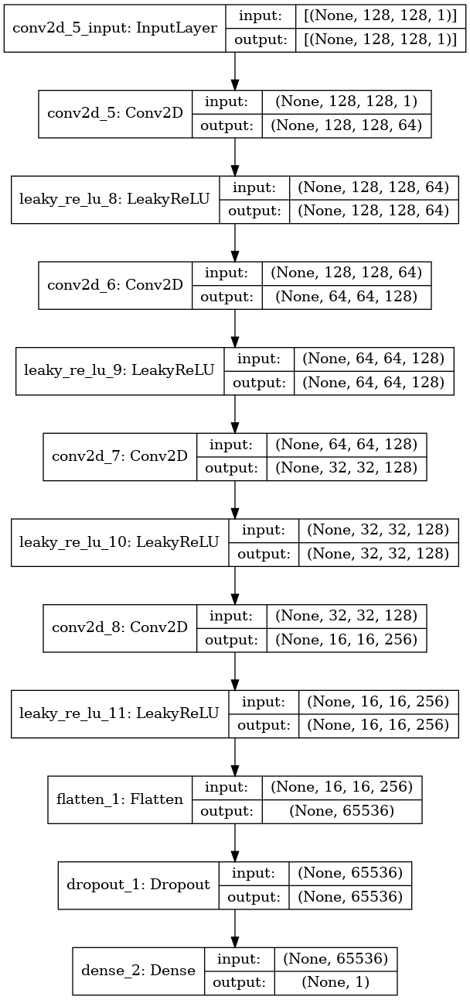

In [40]:
tf.keras.utils.plot_model(discriminator, to_file='discriminator.png', show_shapes=True, show_layer_names=True)

In [41]:
def sample_images(noise, subplots, figsize=(22,8), save=False):
    generated_images = generator.predict(noise)
    plt.figure(figsize=figsize)
    
    for i, image in enumerate(generated_images):
        plt.subplot(subplots[0], subplots[1], i+1)
        if CHANNELS == 1:
            plt.imshow(image.reshape((WIDTH, HEIGHT)), cmap='gray')    
                                                                            
        else:
            plt.imshow(image.reshape((WIDTH, HEIGHT, CHANNELS)))
        if save == True:
            img_name = "gen" + str(i)
            plt.savefig(img_name)
        plt.subplots_adjust(wspace=None, hspace=None)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

## The Training

100%|██████████| 3750/3750 [06:43<00:00,  9.30it/s]


EPOCH: 1 Generator Loss: 2.4726 Discriminator Loss: 0.2074


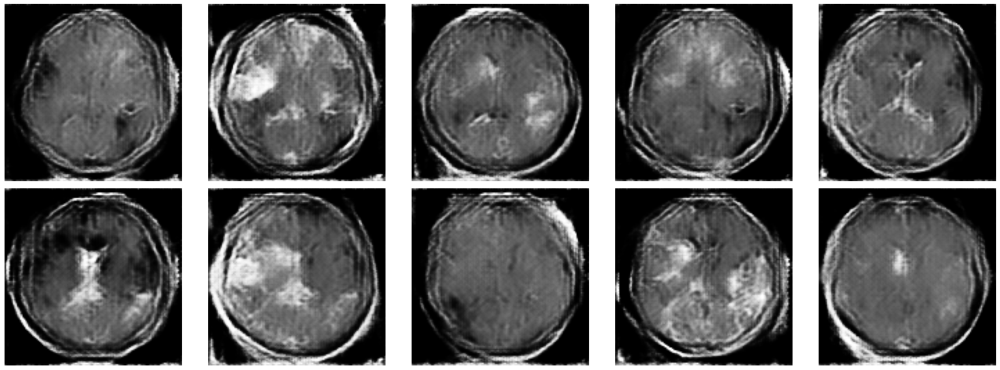

100%|██████████| 3750/3750 [06:42<00:00,  9.31it/s]


EPOCH: 2 Generator Loss: 3.5408 Discriminator Loss: 0.0439


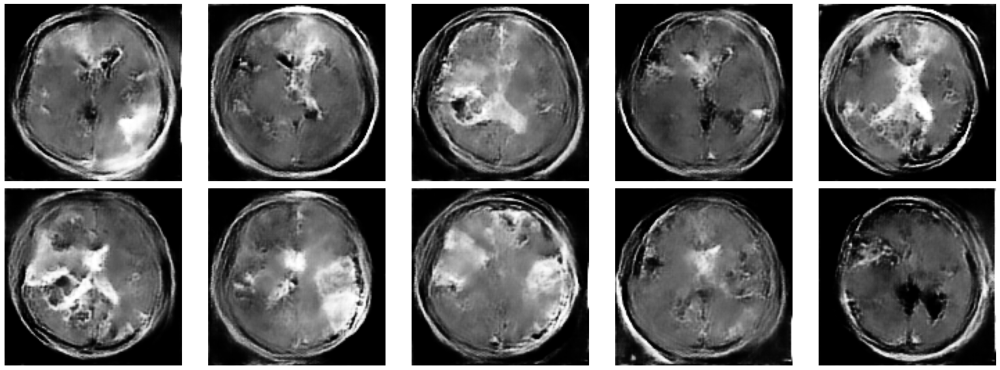

100%|██████████| 3750/3750 [06:43<00:00,  9.30it/s]


EPOCH: 3 Generator Loss: 2.3480 Discriminator Loss: 0.0367


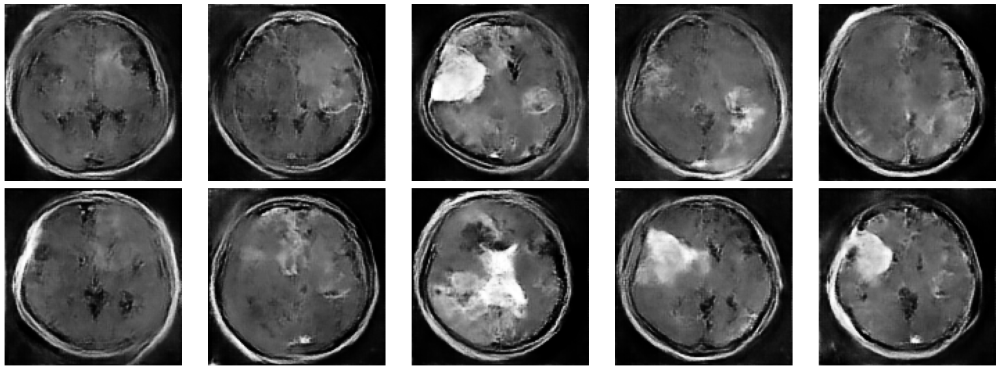

100%|██████████| 3750/3750 [06:45<00:00,  9.25it/s]


EPOCH: 4 Generator Loss: 2.8355 Discriminator Loss: 0.0564


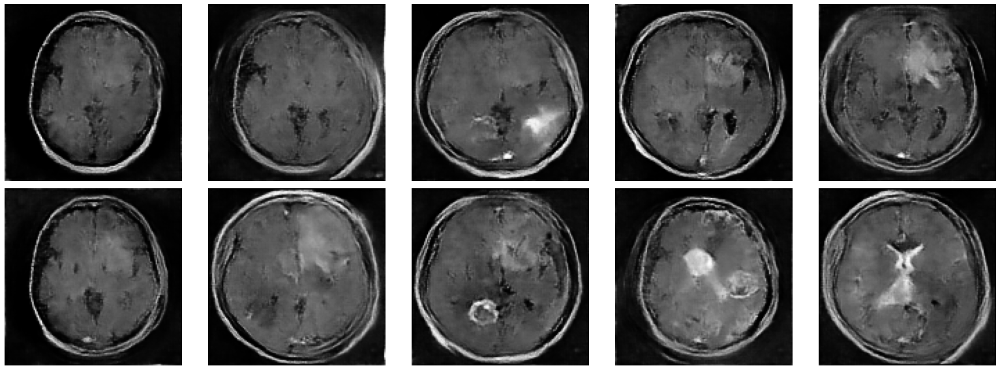

100%|██████████| 3750/3750 [06:47<00:00,  9.19it/s]


EPOCH: 5 Generator Loss: 5.5862 Discriminator Loss: 0.0194


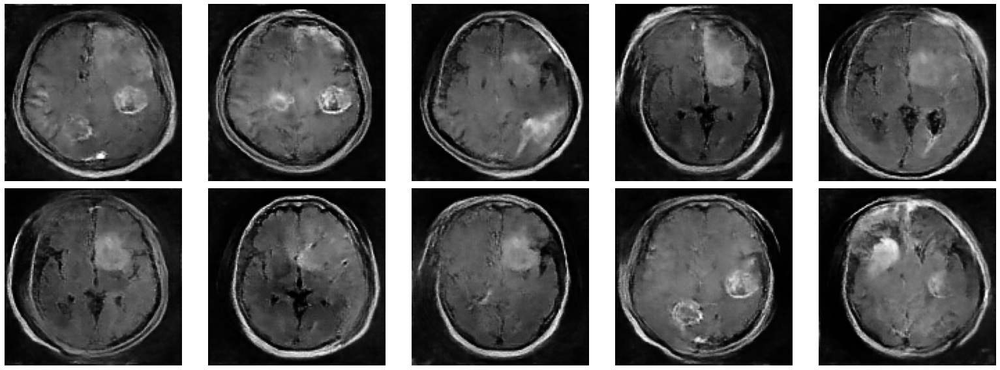

100%|██████████| 3750/3750 [06:58<00:00,  8.97it/s]


EPOCH: 6 Generator Loss: 4.6667 Discriminator Loss: 0.1592


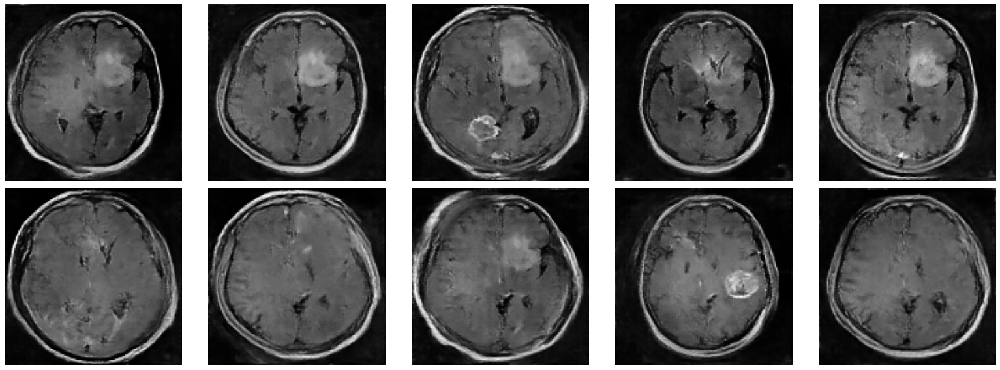

100%|██████████| 3750/3750 [06:56<00:00,  8.99it/s]


EPOCH: 7 Generator Loss: 7.2549 Discriminator Loss: 0.0255


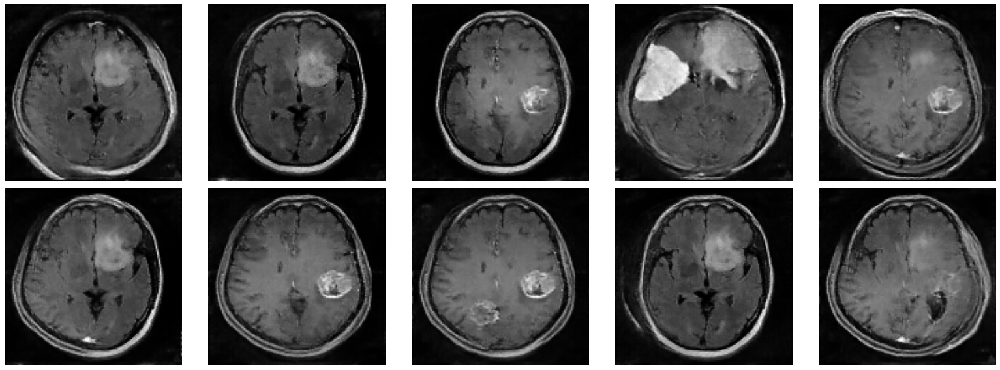

100%|██████████| 3750/3750 [06:57<00:00,  8.98it/s]


EPOCH: 8 Generator Loss: 6.0187 Discriminator Loss: 0.0047


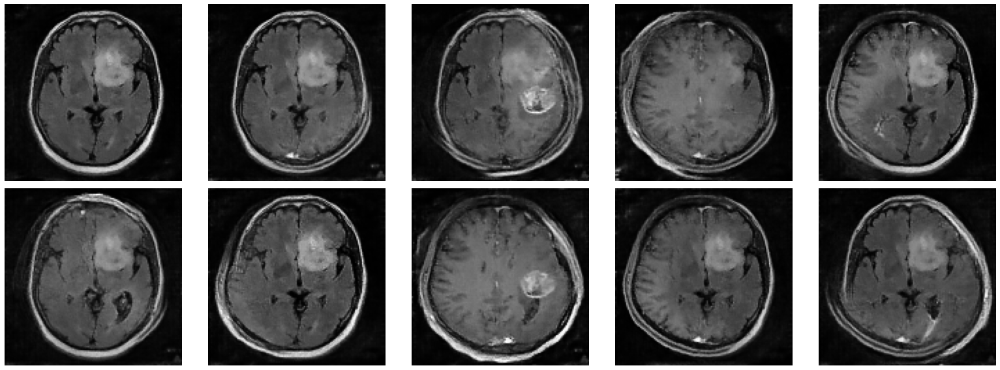

100%|██████████| 3750/3750 [06:53<00:00,  9.07it/s]


EPOCH: 9 Generator Loss: 4.2560 Discriminator Loss: 0.1644


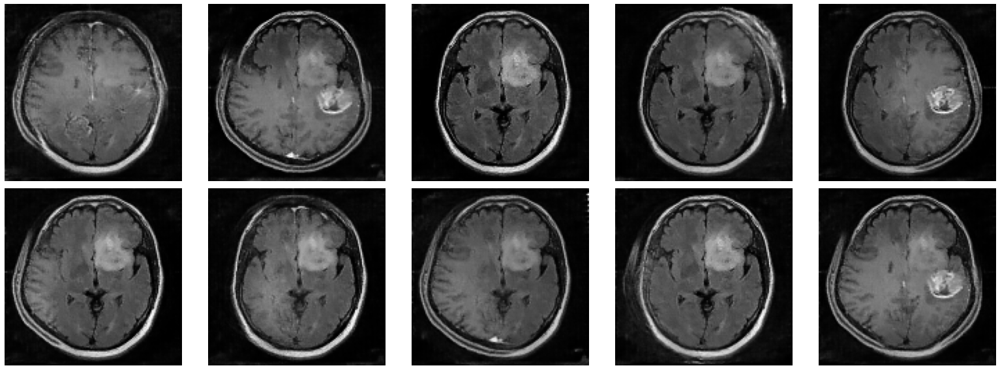

100%|██████████| 3750/3750 [06:51<00:00,  9.11it/s]


EPOCH: 10 Generator Loss: 3.5343 Discriminator Loss: 0.1449


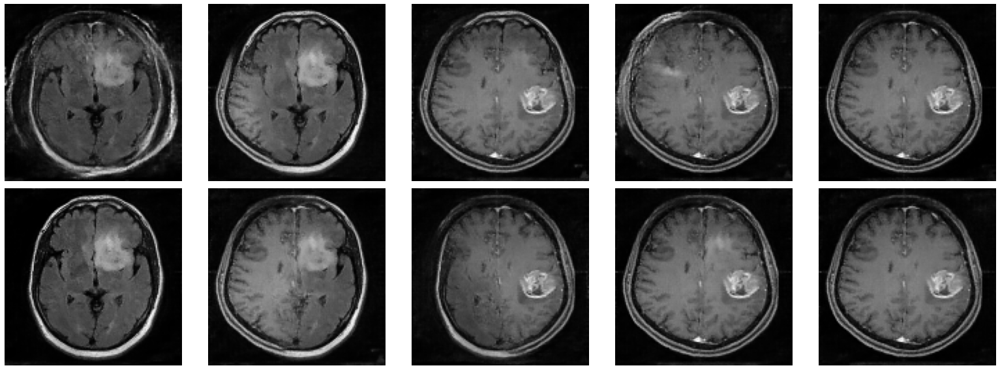

100%|██████████| 3750/3750 [06:47<00:00,  9.20it/s]


EPOCH: 11 Generator Loss: 2.9703 Discriminator Loss: 0.1368


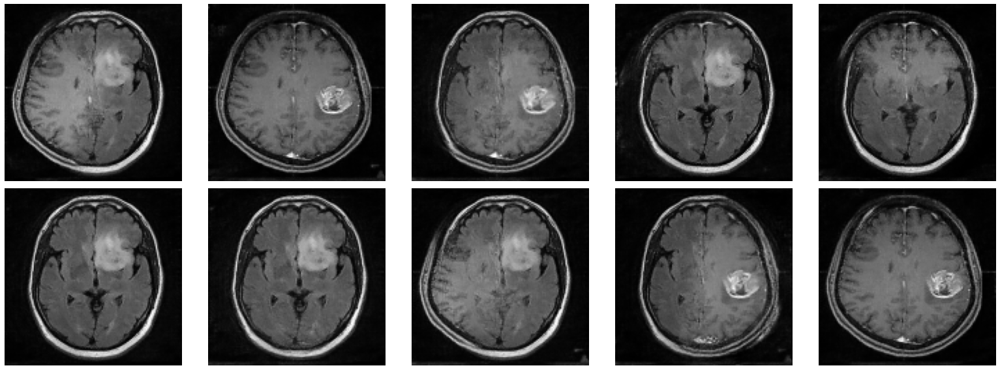

100%|██████████| 3750/3750 [06:44<00:00,  9.26it/s]


EPOCH: 12 Generator Loss: 3.8917 Discriminator Loss: 0.1227


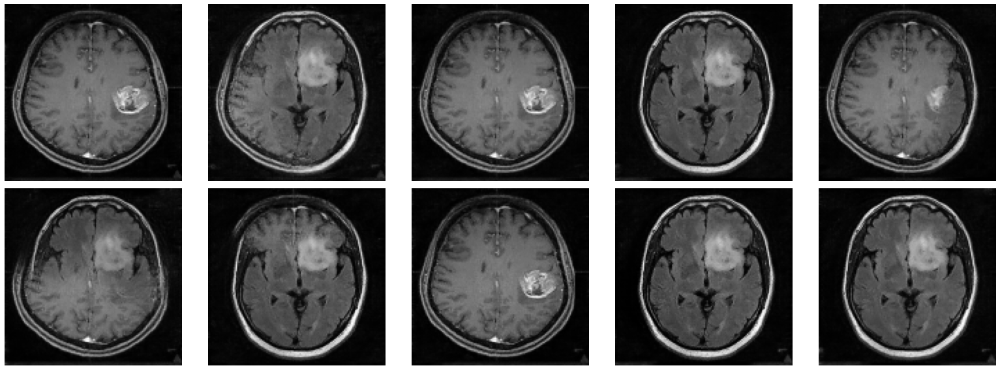

100%|██████████| 3750/3750 [06:45<00:00,  9.25it/s]


EPOCH: 13 Generator Loss: 2.3936 Discriminator Loss: 0.1717


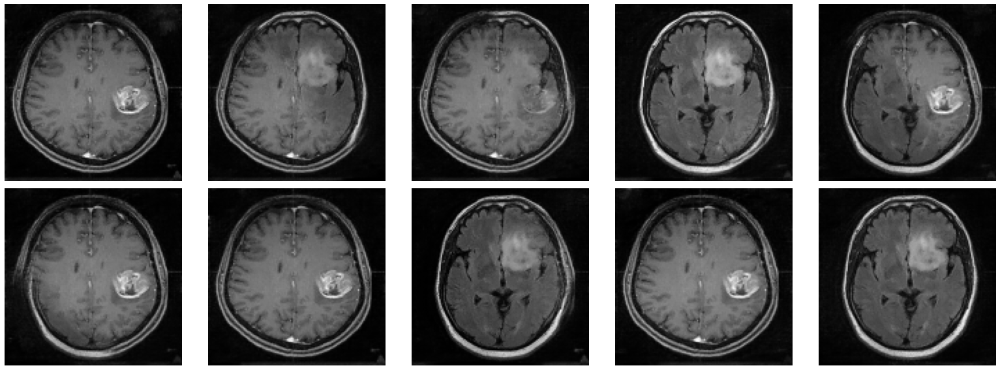

100%|██████████| 3750/3750 [06:47<00:00,  9.21it/s]


EPOCH: 14 Generator Loss: 3.1889 Discriminator Loss: 0.0226


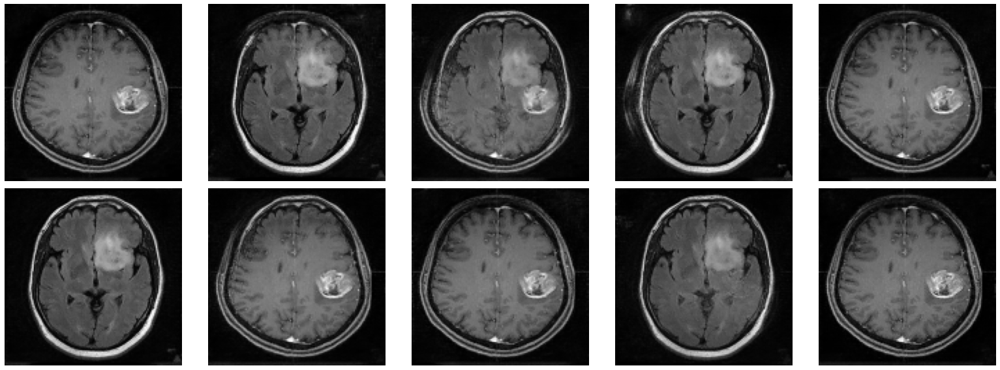

100%|██████████| 3750/3750 [06:46<00:00,  9.24it/s]


EPOCH: 15 Generator Loss: 3.1408 Discriminator Loss: 0.2510


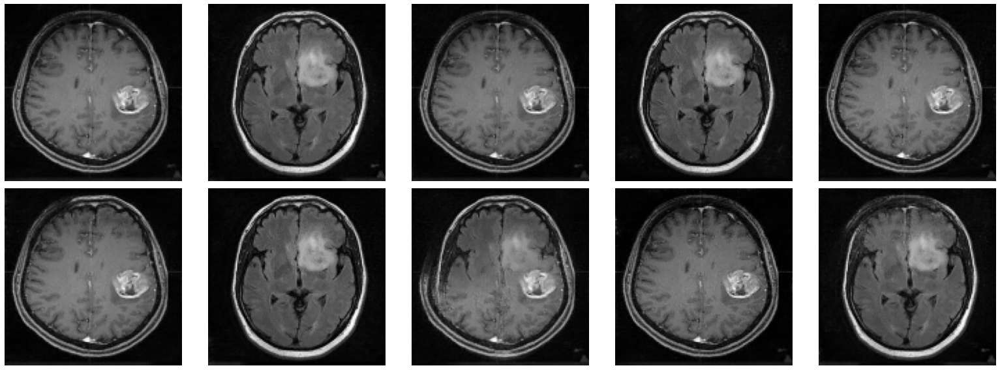

100%|██████████| 3750/3750 [06:45<00:00,  9.24it/s]


EPOCH: 16 Generator Loss: 2.7139 Discriminator Loss: 0.3923


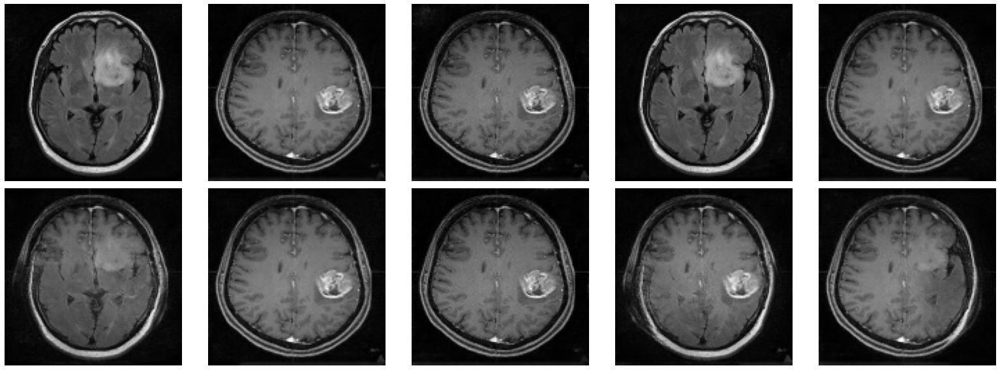

100%|██████████| 3750/3750 [06:50<00:00,  9.13it/s]


EPOCH: 17 Generator Loss: 2.9562 Discriminator Loss: 0.0407


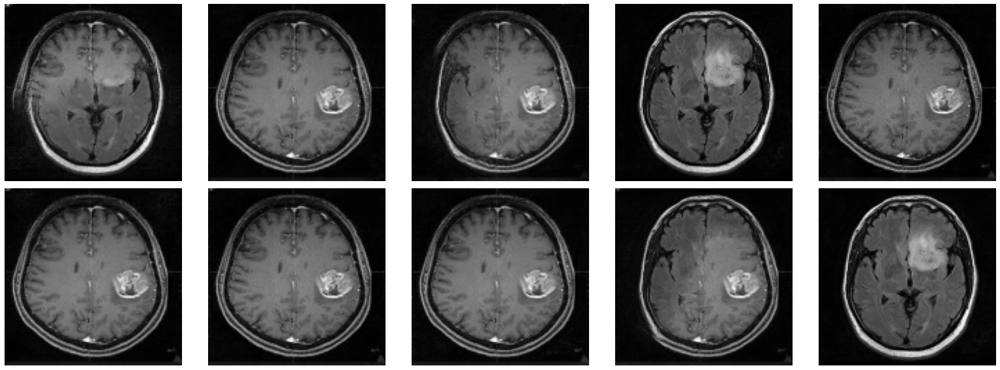

100%|██████████| 3750/3750 [07:02<00:00,  8.87it/s]


EPOCH: 18 Generator Loss: 2.4641 Discriminator Loss: 0.0629


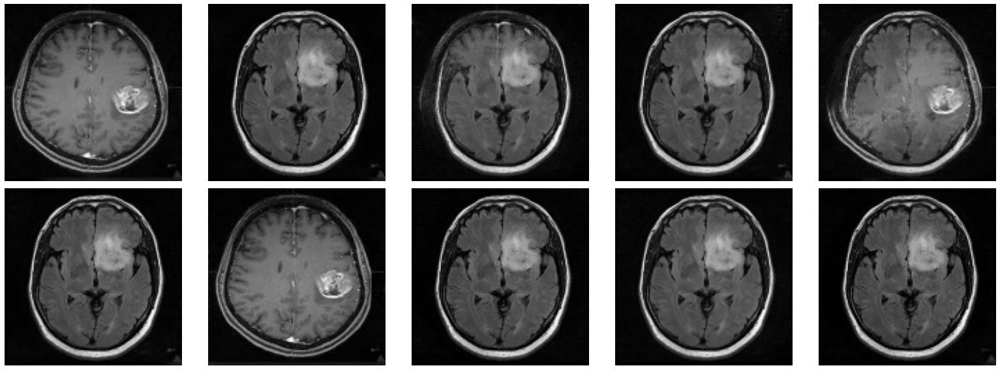

100%|██████████| 3750/3750 [07:03<00:00,  8.85it/s]


EPOCH: 19 Generator Loss: 3.1022 Discriminator Loss: 0.1905


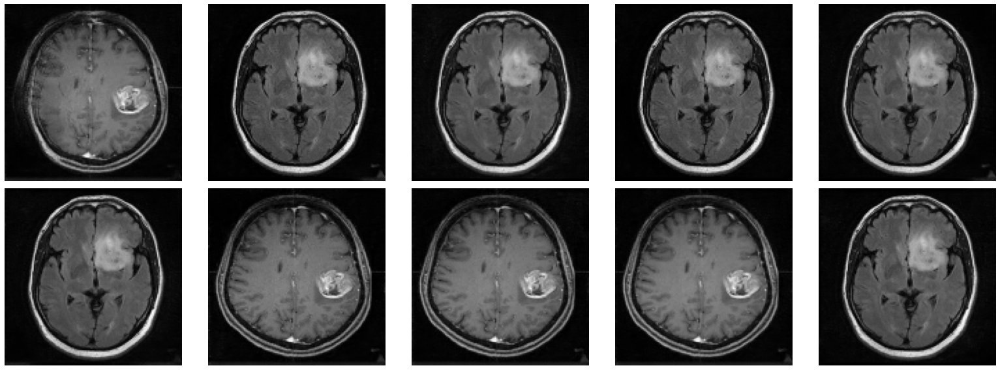

100%|██████████| 3750/3750 [07:06<00:00,  8.80it/s]


EPOCH: 20 Generator Loss: 2.7446 Discriminator Loss: 0.2034


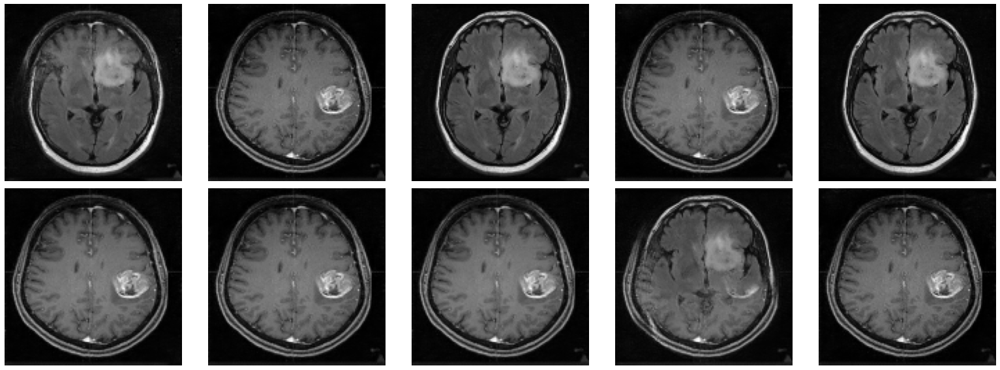

In [42]:
np.random.seed(SEED)
for epoch in range(20):
    for batch in tqdm(range(STEPS_PER_EPOCH)):

        noise = np.random.normal(0,1, size=(BATCH_SIZE, NOISE_DIM))
        fake_X = generator.predict(noise)
        
        idx = np.random.randint(0, X_train.shape[0], size=BATCH_SIZE)
        real_X = X_train[idx]

        X = np.concatenate((real_X, fake_X))

        disc_y = np.zeros(2*BATCH_SIZE)
        disc_y[:BATCH_SIZE] = 1

        d_loss = discriminator.train_on_batch(X, disc_y)
        
        y_gen = np.ones(BATCH_SIZE)
        g_loss = gan.train_on_batch(noise, y_gen)

    print(f"EPOCH: {epoch + 1} Generator Loss: {g_loss:.4f} Discriminator Loss: {d_loss:.4f}")
    noise = np.random.normal(0, 1, size=(10,NOISE_DIM))
    sample_images(noise, (2,5))

# Let's generate some images 

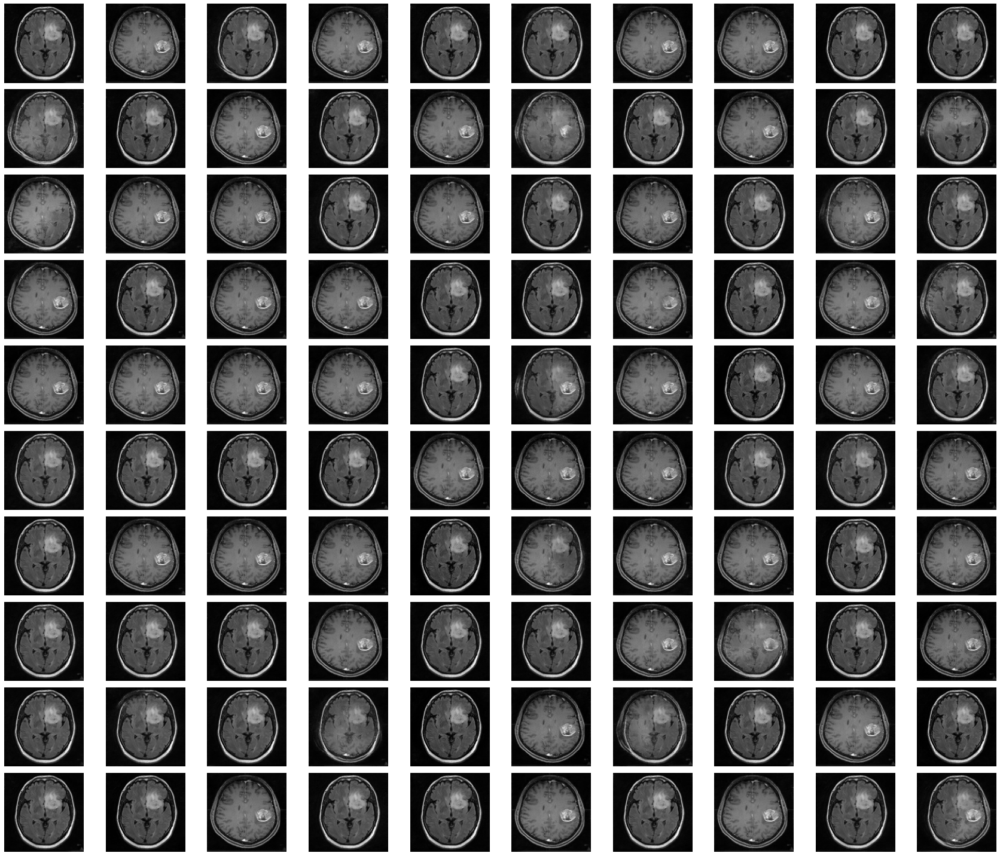

In [47]:
noise = np.random.normal(0, 1, size=(100, NOISE_DIM))
sample_images(noise, (10,10), (24,20), save=True)

# Testing the Generated sample: Plotting the Distributions

<p style="font-size:20px">In this test, we compare the generated images with the real samples by plotting their distributions. If the distributions overlap, that indicates the generated samples are very close to the real ones
</p>

In [44]:
generated_images = generator.predict(noise)
generated_images.shape

(100, 128, 128, 1)

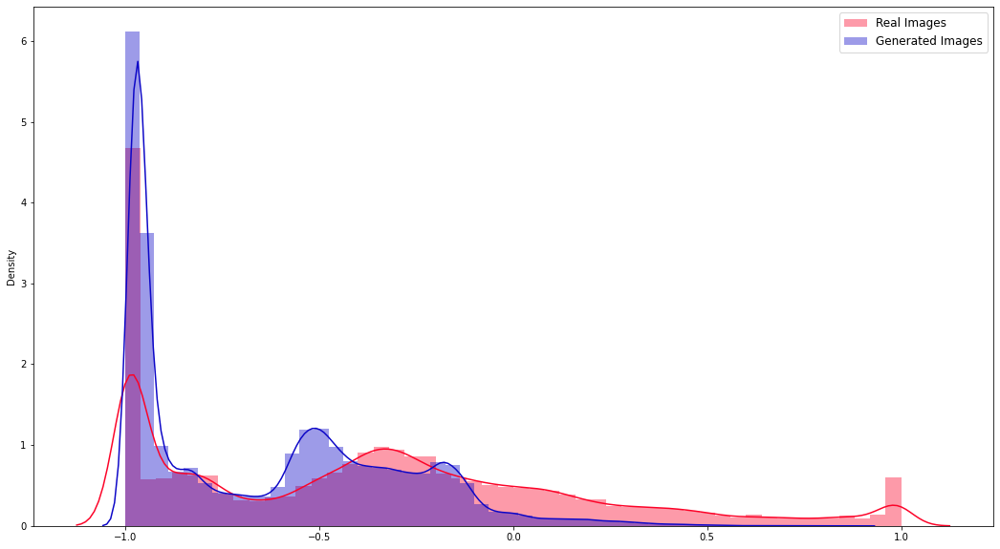

In [48]:
fig, axs = plt.subplots(ncols=1, nrows=1, figsize=(18,10))

sns.distplot(X_train, label='Real Images', hist=True, color='#fc0328', ax=axs)
sns.distplot(generated_images, label='Generated Images', hist=True, color='#0c06c7', ax=axs)

axs.legend(loc='upper right', prop={'size': 12})

plt.show()